In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [1]:
import os
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
from folium.plugins import MarkerCluster
from IPython.display import display

# Fonction pour charger et parser les fichiers
def load_and_parse_data(file_path):
    df = pd.read_csv(file_path, skiprows=6, header=None)
    # Define the column names
    df.columns = ['Latitude', 'Longitude', 'Zero', 'Altitude', 'Days Since 12/30/1899', 'Date String', 'Time String']

    # Ajouter une colonne "Part" en fonction de votre logique
    # Exemple: Pour l'instant, je divise les données en deux parties arbitraires
    df['Part'] = 'Part 1'
    df.loc[df.index > df.index.max() // 2, 'Part'] = 'Part 2'

    geometry = [Point(lon, lat) for lon, lat in zip(df['Longitude'], df['Latitude'])]
    gdf = gpd.GeoDataFrame(df, geometry=geometry)

    return gdf

# Charger le fichier de données
gdf = load_and_parse_data('C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data\\000\\Trajectory\\20081023025304.plt')

# Créer une carte Folium centrée sur la première position de la trajectoire
map_center = [gdf['Latitude'].iloc[0], gdf['Longitude'].iloc[0]]
mymap = folium.Map(location=map_center, zoom_start=15)

# Ajouter une couche de trajectoire pour chaque partie avec des couleurs différentes
colors = {'Part 1': 'blue', 'Part 2': 'red'}  # Ajoutez plus de couleurs si nécessaire

for part, color in colors.items():
    part_gdf = gdf[gdf['Part'] == part]
    part_gdf = part_gdf[['Latitude', 'Longitude']].values.tolist()
    
    # Utiliser MarkerCluster pour regrouper les points pour améliorer la performance
    marker_cluster = MarkerCluster().add_to(mymap)
    
    # Ajouter la couche à la carte
    folium.PolyLine(locations=part_gdf, color=color, weight=2.5, opacity=1, tooltip=part).add_to(marker_cluster)

# Afficher la carte
display(mymap)

In [2]:
import os
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
from folium.plugins import MarkerCluster
import matplotlib.cm as cm
from IPython.display import display

# Fonction pour charger et parser les fichiers
def load_and_parse_data(file_path):
    df = pd.read_csv(file_path, skiprows=6, header=None)
    # Define the column names
    df.columns = ['Latitude', 'Longitude', 'Zero', 'Altitude', 'Days Since 12/30/1899', 'Date String', 'Time String']
    geometry = [Point(lon, lat) for lon, lat in zip(df['Longitude'], df['Latitude'])]
    gdf = gpd.GeoDataFrame(df, geometry=geometry)
    return gdf

# Dossier contenant les fichiers .plt de l'utilisateur
user_folder = 'C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data\\000\\Trajectory'

# Liste pour stocker les GeoDataFrames des différents fichiers
gdf_list = []

# Charger et traiter chaque fichier .plt
for file_name in os.listdir(user_folder):
    if file_name.endswith('.plt'):
        file_path = os.path.join(user_folder, file_name)
        gdf = load_and_parse_data(file_path)
        gdf_list.append(gdf)

# Créer une carte Folium centrée sur la première position de la trajectoire
map_center = [gdf_list[0]['Latitude'].iloc[0], gdf_list[0]['Longitude'].iloc[0]]
mymap = folium.Map(location=map_center, zoom_start=15)

# Utiliser une palette de couleurs pour différencier les fichiers
colors = cm.viridis(range(len(gdf_list)))

for i, gdf in enumerate(gdf_list):
    color = "#{:02x}{:02x}{:02x}".format(int(colors[i][0] * 255), int(colors[i][1] * 255), int(colors[i][2] * 255))
    gdf_coords = gdf[['Latitude', 'Longitude']].values.tolist()
    
    # Utiliser MarkerCluster pour regrouper les points pour améliorer la performance
    marker_cluster = MarkerCluster().add_to(mymap)
    
    # Ajouter la couche à la carte
    folium.PolyLine(locations=gdf_coords, color=color, weight=2.5, opacity=1).add_to(marker_cluster)

# Afficher la carte
display(mymap)


In [3]:
import os
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
from folium.plugins import MarkerCluster
import matplotlib.cm as cm
from IPython.display import display

# Fonction pour charger et parser les fichiers
def load_and_parse_data(file_path):
    df = pd.read_csv(file_path, skiprows=6, header=None)
    # Define the column names
    df.columns = ['Latitude', 'Longitude', 'Zero', 'Altitude', 'Days Since 12/30/1899', 'Date String', 'Time String']
    geometry = [Point(lon, lat) for lon, lat in zip(df['Longitude'], df['Latitude'])]
    gdf = gpd.GeoDataFrame(df, geometry=geometry)
    return gdf

# Dossiers contenant les fichiers .plt des utilisateurs
user_folders = ['C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data\\000\\Trajectory',
                'C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data\\001\\Trajectory',
                'C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data\\002\\Trajectory']

# Liste pour stocker les GeoDataFrames des différents fichiers
gdf_list = []

# Charger et traiter chaque fichier .plt pour chaque utilisateur
for user_folder in user_folders:
    for file_name in os.listdir(user_folder):
        if file_name.endswith('.plt'):
            file_path = os.path.join(user_folder, file_name)
            gdf = load_and_parse_data(file_path)
            gdf_list.append(gdf)

# Créer une carte Folium centrée sur la première position de la première trajectoire
map_center = [gdf_list[0]['Latitude'].iloc[0], gdf_list[0]['Longitude'].iloc[0]]
mymap = folium.Map(location=map_center, zoom_start=15)

# Utiliser une seule couleur pour chaque utilisateur
colors = ['blue', 'green', 'red']  # Ajoutez plus de couleurs si nécessaire

for i, gdf in enumerate(gdf_list):
    color = colors[i % len(colors)]
    gdf_coords = gdf[['Latitude', 'Longitude']].values.tolist()
    
    # Utiliser MarkerCluster pour regrouper les points pour améliorer la performance
    marker_cluster = MarkerCluster().add_to(mymap)
    
    # Ajouter la couche à la carte
    folium.PolyLine(locations=gdf_coords, color=color, weight=2.5, opacity=1).add_to(marker_cluster)

# Afficher la carte
display(mymap)

In [96]:
pip install skmob

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement skmob (from versions: none)
ERROR: No matching distribution found for skmob


In [4]:
import os
import pandas as pd

# Fonction pour charger et parser les fichiers .plt
def load_plt_file(file_path, user_id):
    df = pd.read_csv(file_path, skiprows=6, header=None)
    df.columns = ['Latitude', 'Longitude', 'Zero', 'Altitude', 'Days Since 12/30/1899', 'Date String', 'Time String']
    
    # Ajouter la colonne d'ID de personne
    df['User_ID'] = user_id
    
    return df

# Dossier racine contenant les fichiers .plt
root_folder = 'C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data'

# Liste pour stocker les DataFrames des différentes personnes
dfs_list = []

# Charger et traiter chaque fichier .plt pour chaque personne
for user_id in range(182):
    user_folder = os.path.join(root_folder, f'{user_id:03d}', 'Trajectory')
    
    # Liste pour stocker les DataFrames des différents fichiers .plt de la personne
    user_dfs_list = []
    
    for file_name in os.listdir(user_folder):
        if file_name.endswith('.plt'):
            file_path = os.path.join(user_folder, file_name)
            df = load_plt_file(file_path, user_id)
            user_dfs_list.append(df)
    
    # Concaténer tous les fichiers .plt de la personne en un seul DataFrame
    user_df = pd.concat(user_dfs_list, ignore_index=True)
    
    # Ajouter le DataFrame de la personne à la liste globale
    dfs_list.append(user_df)

# Concaténer tous les DataFrames des personnes en un seul DataFrame global
final_df = pd.concat(dfs_list, ignore_index=True)

# Afficher le DataFrame final
print(final_df)

           Latitude   Longitude  Zero     Altitude  Days Since 12/30/1899  \
0         39.984702  116.318417     0   492.000000           39744.120185   
1         39.984683  116.318450     0   492.000000           39744.120255   
2         39.984686  116.318417     0   492.000000           39744.120313   
3         39.984688  116.318385     0   492.000000           39744.120370   
4         39.984655  116.318263     0   492.000000           39744.120428   
...             ...         ...   ...          ...                    ...   
24876973  40.914867  111.710500     0  3802.493438           39521.152731   
24876974  40.914267  111.710333     0  3795.931759           39521.153669   
24876975  40.912467  111.710667     0  3795.931759           39521.154884   
24876976  40.911517  111.711317     0  3779.527559           39521.155185   
24876977  40.910933  111.711617     0  3802.493438           39521.155324   

         Date String Time String  User_ID  
0         2008-10-23    02:53:0

In [5]:
final_df

,Latitude,Longitude,Zero,Altitude,Days Since 12/30/1899,Date String,Time String,User_ID
0,39.984702,116.318417,0,492.000000,39744.120185,2008-10-23,02:53:04,0
1,39.984683,116.318450,0,492.000000,39744.120255,2008-10-23,02:53:10,0
2,39.984686,116.318417,0,492.000000,39744.120313,2008-10-23,02:53:15,0
3,39.984688,116.318385,0,492.000000,39744.120370,2008-10-23,02:53:20,0
4,39.984655,116.318263,0,492.000000,39744.120428,2008-10-23,02:53:25,0
...,...,...,...,...,...,...,...,...
24876973,40.914867,111.710500,0,3802.493438,39521.152731,2008-03-14,03:39:56,181
24876974,40.914267,111.710333,0,3795.931759,39521.153669,2008-03-14,03:41:17,181
24876975,40.912467,111.710667,0,3795.931759,39521.154884,2008-03-14,03:43:02,181
24876976,40.911517,111.711317,0,3779.527559,39521.155185,2008-03-14,03:43:28,181


In [6]:
# Sauvegarder le DataFrame final dans un fichier CSV
final_df.to_csv('C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data\\resultat_final.csv', index=False)

In [7]:
import pandas as pd
from tqdm.auto import tqdm

# Load the data
file_path = 'C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data\\resultat_final.csv'
data = pd.read_csv(file_path)

# Show the head of the dataframe
data_head = data.head()
print(data_head)

# Describe the dataframe
data_description = data.describe()
print(data_description)

    Latitude   Longitude  Zero  Altitude  Days Since 12/30/1899 Date String  \
0  39.984702  116.318417     0     492.0           39744.120185  2008-10-23   
1  39.984683  116.318450     0     492.0           39744.120255  2008-10-23   
2  39.984686  116.318417     0     492.0           39744.120313  2008-10-23   
3  39.984688  116.318385     0     492.0           39744.120370  2008-10-23   
4  39.984655  116.318263     0     492.0           39744.120428  2008-10-23   

  Time String  User_ID  
0    02:53:04        0  
1    02:53:10        0  
2    02:53:15        0  
3    02:53:20        0  
4    02:53:25        0  
           Latitude     Longitude        Zero      Altitude  \
count  2.487698e+07  2.487698e+07  24876978.0  2.487698e+07   
mean   3.897989e+01  1.123597e+02         0.0  5.130172e+02   
std    4.070501e+00  2.717960e+01         0.0  2.301976e+03   
min    1.044024e+00 -1.799696e+02         0.0 -3.264760e+04   
25%    3.990636e+01  1.163065e+02         0.0  7.870000e+01 

In [8]:
import pandas as pd
from tqdm.auto import tqdm

# Load the data
file_path = 'C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data\\resultat_final.csv'
data = pd.read_csv(file_path)
data.dtypes

Latitude                 float64
Longitude                float64
Zero                       int64
Altitude                 float64
Days Since 12/30/1899    float64
Date String               object
Time String               object
User_ID                    int64
dtype: object

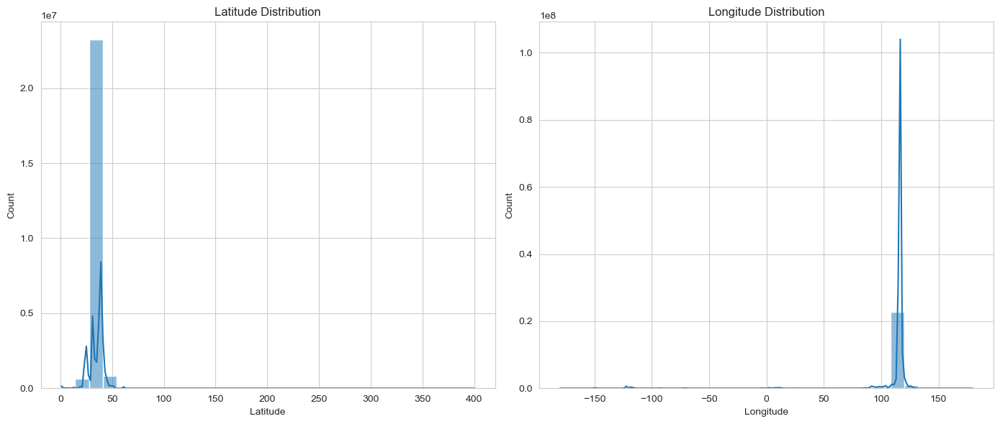

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style('whitegrid')

# Plot distributions of Latitude and Longitude
plt.figure(figsize=(14, 6))

# Latitude Distribution
plt.subplot(1, 2, 1)
sns.histplot(data['Latitude'], bins=30, kde=True)
plt.title('Latitude Distribution')

# Longitude Distribution
plt.subplot(1, 2, 2)
sns.histplot(data['Longitude'], bins=30, kde=True)
plt.title('Longitude Distribution')

plt.tight_layout()
plt.show()

C:\Users\rayan\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


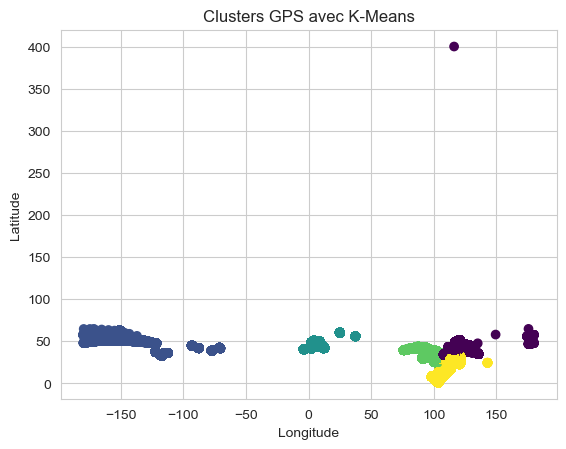

In [13]:
from sklearn.cluster import KMeans

def load_plt_file(file_path):
    df = pd.read_csv(file_path, skiprows=6, header=None)
    df.columns = ['Latitude', 'Longitude', 'Zero', 'Altitude', 'Days Since 12/30/1899', 'Date String', 'Time String', 'User_ID']
    return df

# Charger les données
data = load_plt_file(file_path)

# Sélectionner les colonnes de latitude et de longitude
X = data[['Latitude', 'Longitude']]

# Appliquer K-Means
kmeans = KMeans(n_clusters=5)  # Utiliser un nombre approprié de clusters
kmeans.fit(X)

# Ajouter les étiquettes de cluster aux données
data['Cluster'] = kmeans.labels_

# Visualiser les clusters
plt.scatter(data['Longitude'], data['Latitude'], c=data['Cluster'], cmap='viridis')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Clusters GPS avec K-Means')
plt.show()

In [15]:
from sklearn.cluster import DBSCAN

# Supposons que `data` est votre DataFrame contenant les données GPS
X = data[['Latitude', 'Longitude']].to_numpy()

# Appliquer DBSCAN
db = DBSCAN(eps=0.1, min_samples=10).fit(X)

# Les étiquettes des clusters
labels = db.labels_

# Identifiez les points centraux
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True

# Nombre de clusters dans les étiquettes, en ignorant le bruit si présent
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Nombre estimé de clusters: %d' % n_clusters_)
print('Nombre estimé de points de bruit: %d' % n_noise_)

# Visualisation des résultats
# Noir est utilisé pour le bruit.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Noir utilisé pour le bruit.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 1], xy[:, 0], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 1], xy[:, 0], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Nombre estimé de clusters: %d' % n_clusters_)
plt.show()

MemoryError: 

In [16]:
import requests
from urllib.parse import urlencode

def reverse_geocode(lat, lon):
    parameters = {'lat': lat, 'lon': lon, 'format': 'json'}
    url = f"https://nominatim.openstreetmap.org/reverse?{urlencode(parameters)}"
    response = requests.get(url)
    if response.status_code == 200:
        return response.json()
    else:
        return "Erreur dans la réponse de l'API."

# Utilisez cette fonction pour géocoder une latitude et une longitude spécifiques
latitude = 48.8566
longitude = 2.3522
address = reverse_geocode(latitude, longitude)

print(address)

{'place_id': 82440281, 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. http://osm.org/copyright', 'osm_type': 'relation', 'osm_id': 284089, 'lat': '48.856426299999995', 'lon': '2.3525275780116073', 'class': 'amenity', 'type': 'townhall', 'place_rank': 30, 'importance': 0.4901387506169282, 'addresstype': 'amenity', 'name': 'Hôtel de Ville', 'display_name': "Hôtel de Ville, Place de l'Hôtel de Ville, Quartier Saint-Merri, Paris 4e Arrondissement, Paris, Île-de-France, France métropolitaine, 75004, France", 'address': {'amenity': 'Hôtel de Ville', 'road': "Place de l'Hôtel de Ville", 'city_block': 'Quartier Saint-Merri', 'suburb': 'Paris 4e Arrondissement', 'city_district': 'Paris', 'city': 'Paris', 'ISO3166-2-lvl6': 'FR-75', 'state': 'Île-de-France', 'ISO3166-2-lvl4': 'FR-IDF', 'region': 'France métropolitaine', 'postcode': '75004', 'country': 'France', 'country_code': 'fr'}, 'boundingbox': ['48.8556923', '48.8571608', '2.3516686', '2.3533854']}


In [3]:
import pandas as pd
import os

base_path = "C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data"

# Parcourir tous les dossiers d'utilisateurs
for user_folder in os.listdir(base_path):
    user_path = os.path.join(base_path, user_folder, "Trajectory")
    
    # Liste pour stocker les données de tous les fichiers .plt pour cet utilisateur
    all_user_data = []

    # Parcourir tous les fichiers .plt dans le dossier Trajectory
    for file_name in os.listdir(user_path):
        if file_name.endswith('.plt'):
            file_path = os.path.join(user_path, file_name)
            
            # Lire le fichier .plt en sautant les 6 premières lignes d'en-tête
            data = pd.read_csv(file_path, skiprows=6, header=None, names=['Latitude', 'Longitude', 'Zero', 'Altitude', 'Days Since 12/30/1899', 'Date String', 'Time String'])
            
            # Exclure la colonne 'Altitude'
            data = data[['Latitude', 'Longitude', 'Date String', 'Time String']]
            
            # Convertir en format date-heure
            # Assurez-vous que le format spécifié ici correspond à celui de vos données
            data['DateTime'] = pd.to_datetime(data['Date String'] + ' ' + data['Time String'], format='%Y-%m-%d %H:%M:%S')
            data.drop(['Date String', 'Time String'], axis=1, inplace=True)
            
            # Regroupement par minute  ?
            data = data.groupby(['DateTime']).agg({'Latitude': 'mean', 'Longitude': 'mean'}).reset_index()

            # Ajouter un identifiant d'utilisateur
            data['User_ID'] = user_folder
            
            # Ajouter les données à la liste
            all_user_data.append(data)
    
    # Concaténer toutes les données de l'utilisateur en un seul DataFrame
    user_data = pd.concat(all_user_data, ignore_index=True)
    
    # Définir le chemin de sauvegarde pour être le même que le dossier Trajectory
    save_path = os.path.join(user_path, f"user_{user_folder}.csv")

    # Sauvegarder en CSV
    user_data.to_csv(save_path, index=False)


In [4]:
import pandas as pd
import os

base_path = "C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data"

# Parcourir tous les dossiers d'utilisateurs
for user_folder in os.listdir(base_path):
    user_path = os.path.join(base_path, user_folder, "Trajectory")
    
    # Liste pour stocker les données de tous les fichiers .plt pour cet utilisateur
    all_user_data = []

    # Parcourir tous les fichiers .plt dans le dossier Trajectory
    for file_name in os.listdir(user_path):
        if file_name.endswith('.plt'):
            file_path = os.path.join(user_path, file_name)
            
            # Lire le fichier .plt en sautant les 6 premières lignes d'en-tête
            data = pd.read_csv(file_path, skiprows=6, header=None, names=['Latitude', 'Longitude', 'Zero', 'Altitude', 'Days Since 12/30/1899', 'Date String', 'Time String'])
            
            # Exclure la colonne 'Altitude'
            data = data[['Latitude', 'Longitude', 'Zero', 'Days Since 12/30/1899', 'Date String', 'Time String']]
            
            # Convertir en format date-heure
            data['DateTime'] = pd.to_datetime(data['Date String'] + ' ' + data['Time String'], format='%Y-%m-%d %H:%M:%S')
            data.drop(['Date String', 'Time String'], axis=1, inplace=True)

            # Arrondir l'horodatage à la minute la plus proche
            data['DateTime'] = data['DateTime'].dt.floor('min')
            
            # Regroupement par minute
            data = data.groupby(['DateTime']).agg({'Latitude': 'mean', 'Longitude': 'mean'}).reset_index()

            # Ajouter un identifiant d'utilisateur
            data['User_ID'] = user_folder
            
            # Ajouter les données à la liste
            all_user_data.append(data)
    
    # Concaténer toutes les données de l'utilisateur en un seul DataFrame
    user_data = pd.concat(all_user_data, ignore_index=True)
    
    # Définir le chemin de sauvegarde pour être le même que le dossier Trajectory
    save_path = os.path.join(user_path, f"user_{user_folder}.csv")

    # Sauvegarder en CSV
    user_data.to_csv(save_path, index=False)

In [6]:
from math import radians, cos, sin, asin, sqrt
import pandas as pd
import os

def calculate_haversine(lon1, lat1, lon2, lat2):
    """
    Calculer la distance de Haversine entre deux points sur la terre (spécifiés en degrés décimaux)
    """
    # Convertir les degrés décimaux en radians
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # Formule Haversine
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    r = 6371000  # Rayon de la Terre en mètres
    return c * r

base_path = "C:\\Users\\rayan\\Downloads\\Geolife Trajectories 1.3\\Geolife Trajectories 1.3\\Data"

# Parcourir tous les dossiers d'utilisateurs
for user_folder in os.listdir(base_path):
    user_path = os.path.join(base_path, user_folder, "Trajectory")
    
    # Parcourir tous les fichiers CSV dans le dossier Trajectory de chaque utilisateur
    for csv_file in os.listdir(user_path):
        if csv_file.endswith('.csv'):
            file_path = os.path.join(user_path, csv_file)
            data = pd.read_csv(file_path)
            
            # Trier par DateTime pour s'assurer que les données sont dans l'ordre chronologique
            data.sort_values(by='DateTime', inplace=True)

            # Calcul de la vitesse
            distances = [0]  # La distance pour la première ligne est 0
            times = [0]      # Le temps pour la première ligne est 0
            for i in range(1, len(data)):
                lon1, lat1, lon2, lat2 = data.loc[i-1, 'Longitude'], data.loc[i-1, 'Latitude'], data.loc[i, 'Longitude'], data.loc[i, 'Latitude']
                distance = calculate_haversine(lon1, lat1, lon2, lat2)
                time = (pd.to_datetime(data.loc[i, 'DateTime']) - pd.to_datetime(data.loc[i-1, 'DateTime'])).total_seconds()
                
                distances.append(distance)
                times.append(time)

            # Éviter la division par zéro et calculer la vitesse
            data['Speed'] = [dist/t if t != 0 else 0 for dist, t in zip(distances, times)]

            # Sauvegarde des données modifiées
            new_file_path = os.path.join(user_path, 'modified_' + csv_file)
            data.to_csv(new_file_path, index=False)
